# CS F425 Deep Learning: Major Project
## Submitted by :
1. Somesh Singh [2018A7PS0175G]
2. Rohit Garg [2018A7PS0193G]
3. Aditya Mishra [2018A7PS0117G]    


# Imports

In [ ]:
import sys
import math, os, random, datetime
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import warnings

warnings.filterwarnings("ignore")

import torch
import torchvision

import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split
from torch.utils.tensorboard import SummaryWriter

from torchvision.datasets import STL10
from torchvision import transforms
from torchvision.utils import make_grid
from PIL import Image, ImageOps, ImageFilter

from sklearn.linear_model import LogisticRegression

%matplotlib inline
%load_ext tensorboard

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# Mount Drive / Download

In [ ]:
from google.colab import drive
drive._mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Reproducibilty

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/logs/runs/new_supervised/WideResNet

<IPython.core.display.Javascript object>

In [ ]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(42)

# Task 1. 
Train a neural network (architecture details upto you) in a supervised manner on
the training portion of the labeled part of STL-10.

# Supervised Learning

## Data Pre-processing

In [ ]:
class GaussianBlur(object):
    def __init__(self, p):
        self.p = p

    def __call__(self, img):
        if random.random() < self.p:
            sigma = random.random() * 1.9 + 0.1
            return img.filter(ImageFilter.GaussianBlur(sigma))
        else:
            return img


class Solarization(object):
    def __init__(self, p):
        self.p = p

    def __call__(self, img):
        if random.random() < self.p:
            return ImageOps.solarize(img)
        else:
            return img

In [ ]:
transform = transforms.Compose(
    [
        transforms.RandomResizedCrop(96, interpolation=Image.BICUBIC),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomApply(
            [
                transforms.ColorJitter(
                    brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1
                )
            ],
            p=0.8,
        ),
        transforms.RandomGrayscale(p=0.2),
        GaussianBlur(p=1.0),
        Solarization(p=0.0),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

test_transform = transforms.Compose(
    [
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), 
    ]
    
)

train_ds = STL10(
    root="/content/drive/MyDrive/data",
    split="train",
    download=True,
    transform=transform,
)
test_ds = STL10(
    root="/content/drive/MyDrive/data", split="test", transform = test_transform,
)

Files already downloaded and verified


## Validation / Test Split and Data loader

In [ ]:
val_test_ratio = 0.25
val_size = int(val_test_ratio * len(test_ds))
test_size = len(test_ds) - val_size
classes = train_ds.classes
s_batch_size = 125

test_ds, val_ds = random_split(test_ds, [test_size, val_size])

train_loader = DataLoader(train_ds, batch_size=s_batch_size, shuffle=False)
val_loader = DataLoader(val_ds, batch_size=s_batch_size, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=s_batch_size, shuffle=False)

## Architecture

### Conv Net (Baseline)

In [ ]:
class BasicConv(nn.Module):
    def __init__(self, filters, kernel_size, stride, dropRate):
        super(BasicConv, self).__init__()
        self.drop = True if dropRate > 0 else False

        self.conv = nn.Conv2d(filters[0], filters[1], kernel_size=kernel_size, stride=stride)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout2d(p=dropRate)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        return self.dropout(x) if self.drop else x

class ConvNet(nn.Module):
    def __init__(self, width=128, dropRate=0.0):
        super(ConvNet, self).__init__()
        self.conv = nn.Sequential(
            *[
              BasicConv((3, width), 3, 2, dropRate), 
              BasicConv((width, width), 3, 2, dropRate),
              BasicConv((width, width), 3, 2, dropRate),
              BasicConv((width, width), 3, 2, dropRate),
              BasicConv((width, width), 3, 2, dropRate),
              nn.Flatten()
            ]
        )

        self.out_features = 512

    def forward(self, x):
        return self.conv(x)

In [ ]:
ConvNet()

ConvNet(
  (conv): Sequential(
    (0): BasicConv(
      (conv): Conv2d(3, 128, kernel_size=(3, 3), stride=(2, 2))
      (relu): ReLU()
      (dropout): Dropout2d(p=0.0, inplace=False)
    )
    (1): BasicConv(
      (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
      (relu): ReLU()
      (dropout): Dropout2d(p=0.0, inplace=False)
    )
    (2): BasicConv(
      (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
      (relu): ReLU()
      (dropout): Dropout2d(p=0.0, inplace=False)
    )
    (3): BasicConv(
      (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
      (relu): ReLU()
      (dropout): Dropout2d(p=0.0, inplace=False)
    )
    (4): BasicConv(
      (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
      (relu): ReLU()
      (dropout): Dropout2d(p=0.0, inplace=False)
    )
    (5): Flatten(start_dim=1, end_dim=-1)
  )
)

## ConvNet Architecture
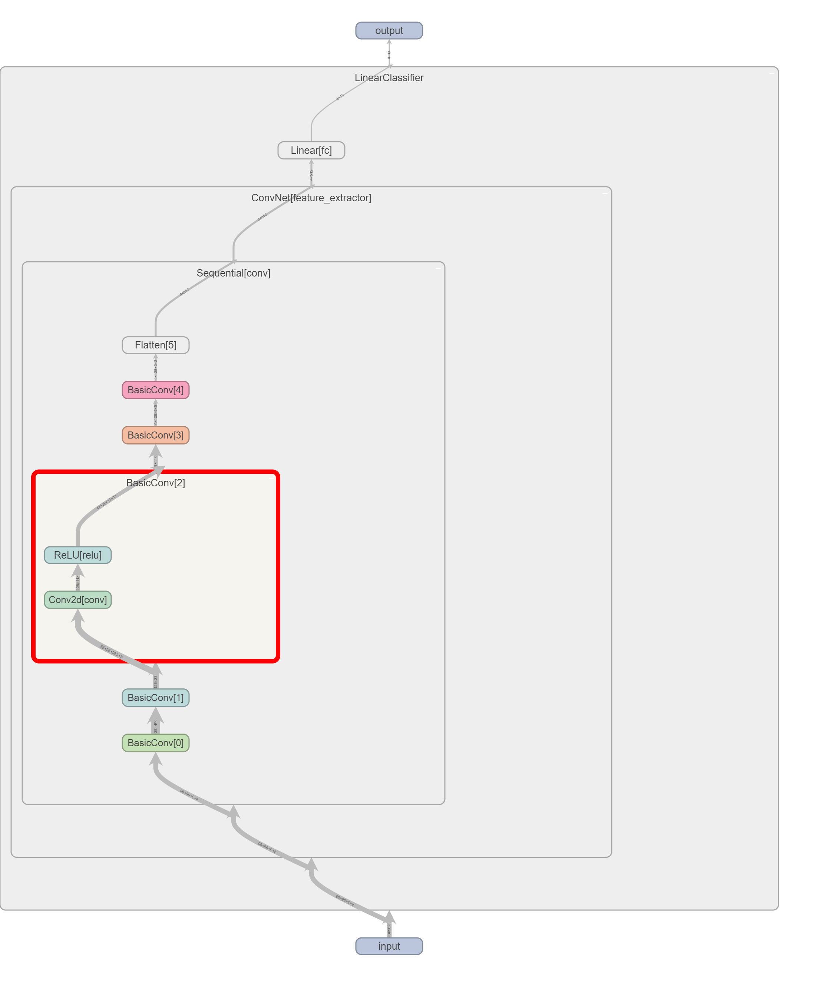

### WideResNet

In [ ]:
class BasicBlock(nn.Module):
    def __init__(
        self,
        in_planes,
        out_planes,
        stride,
        dropRate=0.0,
        activate_before_residual=False,
    ):
        super(BasicBlock, self).__init__()
        self.bn1 = nn.BatchNorm2d(in_planes, momentum=0.001)
        self.relu1 = nn.LeakyReLU(negative_slope=0.1, inplace=True)
        self.conv1 = nn.Conv2d(
            in_planes, out_planes, kernel_size=3, stride=stride, padding=1, bias=False
        )
        self.bn2 = nn.BatchNorm2d(out_planes, momentum=0.001)
        self.relu2 = nn.LeakyReLU(negative_slope=0.1, inplace=True)
        self.conv2 = nn.Conv2d(
            out_planes, out_planes, kernel_size=3, stride=1, padding=1, bias=False
        )
        self.droprate = dropRate
        self.equalInOut = in_planes == out_planes
        self.convShortcut = (
            (not self.equalInOut)
            and nn.Conv2d(
                in_planes,
                out_planes,
                kernel_size=1,
                stride=stride,
                padding=0,
                bias=False,
            )
            or None
        )
        self.activate_before_residual = activate_before_residual

    def forward(self, x):
        if not self.equalInOut and self.activate_before_residual == True:
            x = self.relu1(self.bn1(x))
        else:
            out = self.relu1(self.bn1(x))
        out = self.relu2(self.bn2(self.conv1(out if self.equalInOut else x)))
        if self.droprate > 0:
            out = F.dropout(out, p=self.droprate, training=self.training)
        out = self.conv2(out)
        return torch.add(x if self.equalInOut else self.convShortcut(x), out)


class NetworkBlock(nn.Module):
    def __init__(
        self,
        nb_layers,
        in_planes,
        out_planes,
        block,
        stride,
        dropRate=0.0,
        activate_before_residual=False,
    ):
        super(NetworkBlock, self).__init__()
        self.layer = self._make_layer(
            block,
            in_planes,
            out_planes,
            nb_layers,
            stride,
            dropRate,
            activate_before_residual,
        )

    def _make_layer(
        self,
        block,
        in_planes,
        out_planes,
        nb_layers,
        stride,
        dropRate,
        activate_before_residual,
    ):
        layers = []
        for i in range(int(nb_layers)):
            layers.append(
                block(
                    i == 0 and in_planes or out_planes,
                    out_planes,
                    i == 0 and stride or 1,
                    dropRate,
                    activate_before_residual,
                )
            )
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.layer(x)


class WideResNet(nn.Module):
    def __init__(self, depth=34, widen_factor=2, dropRate=0.0):
        super(WideResNet, self).__init__()
        nChannels = [
            8,
            8 * widen_factor,
            16 * widen_factor,
            32 * widen_factor,
            64 * widen_factor,
        ]
        assert (depth - 4) % 6 == 0
        n = (depth - 4) / 6
        block = BasicBlock
        # 1st conv before any network block
        self.conv1 = nn.Conv2d(
            3, nChannels[0], kernel_size=3, stride=1, padding=1, bias=False
        )
        # 1st block
        self.block1 = NetworkBlock(
            n,
            nChannels[0],
            nChannels[1],
            block,
            1,
            dropRate,
            activate_before_residual=True,
        )
        # 2nd block
        self.block2 = NetworkBlock(n, nChannels[1], nChannels[2], block, 2, dropRate)
        # 3rd block
        self.block3 = NetworkBlock(n, nChannels[2], nChannels[3], block, 2, dropRate)
        # 4th block
        self.block4 = NetworkBlock(n, nChannels[3], nChannels[4], block, 2, dropRate)

        # global average pooling and classifier
        self.bn1 = nn.BatchNorm2d(nChannels[4], momentum=0.001)
        self.relu = nn.LeakyReLU(negative_slope=0.1, inplace=True)
        self.flatten = nn.Flatten()
        self.nChannels = nChannels[4]
        self.out_features = 128

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2.0 / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def forward(self, x):
        out = self.conv1(x)
        out = self.block1(out)
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.relu(self.bn1(out))
        out = F.avg_pool2d(out, 12)
        return self.flatten(out)

## WRN-45-2 Architecture
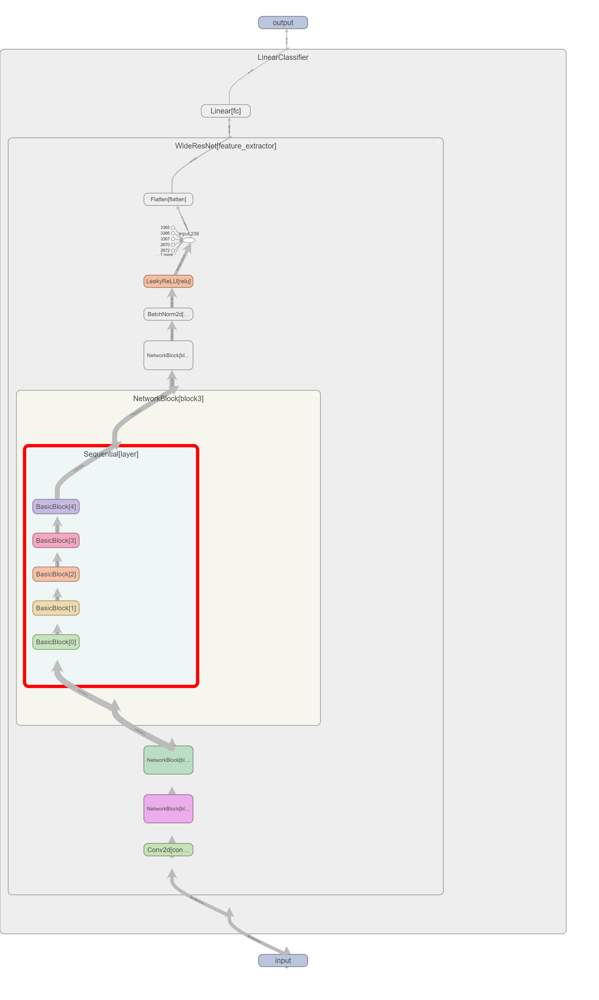

### ResNet

In [ ]:
import torchvision.models as models
from torchsummary import summary

class ResNet18(nn.Module):
    def __init__(self):
        super(ResNet18, self).__init__()
        self.model = models.resnet18().to(device)
        self.resnet = torch.nn.Sequential(*(list(self.model.children())[:-1]))
        self.conv = nn.Sequential(
        *[
            self.resnet,
            nn.Flatten()
        ]
        )

        self.out_features = 512



    def forward(self, x):
        return self.conv(x)

### Linear Classifier

In [ ]:
class LinearClassifier(nn.Module):
    def __init__(self, model, num_classes):
        super(LinearClassifier, self).__init__()
        self.feature_extractor = model
        self.fc = nn.Linear(in_features=model.out_features, out_features=num_classes)
        self.name = type(self.feature_extractor).__name__
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight.data)
                m.bias.data.zero_()

    def forward(self, x):
        x = self.feature_extractor(x)
        return self.fc(x)

## Utils

In [ ]:
def train_batch(images, labels, sup_model, optimizer, criterion):
    images, labels = images.to(device), labels.to(device)

    optimizer.zero_grad()
    prob = sup_model(images)

    loss = criterion(prob, labels)
    accuracy = (prob.argmax(dim=1) == labels).sum() / prob.size()[0]

    loss.backward()
    optimizer.step()

    return loss.item(), accuracy.item()


def eval_batch(images, labels, sup_model):
    images, labels = images.to(device), labels.to(device)
    prob = sup_model(images)
    accuracy = (prob.argmax(dim=1) == labels).sum() / prob.size()[0]

    return accuracy.item()


def tb_graph(model, name):
    tb = SummaryWriter(f"/content/drive/MyDrive/logs/static/{name}")
    model.to(device)
    images, _ = next(iter(train_loader))
    images = images.to(device)[:4]
    grid = make_grid(images)
    tb.add_image("images", grid)
    tb.add_graph(model, images)
    tb.close()

## Training Loop

In [ ]:
def train_loop(extractor = WideResNet().to(device) , lr = 2e-3, epochs = 50, checkpoint=""):
    sup_model = LinearClassifier(extractor, len(classes)).to(device)
    optimizer = optim.Adam(sup_model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    
    if checkpoint != "":
        checkpoint = torch.load(checkpoint)
        sup_model.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        epoch = checkpoint['epoch']
    else:
        epoch=0
            
    model_class = sup_model.name
    tb_graph(sup_model, model_class)
    tb = SummaryWriter(
        f"/content/drive/MyDrive/temp_logs/runs/new_supervised/{model_class}/"
        + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        + f"{epochs}epochs"
    )

    with tqdm(range(epoch, epoch+epochs), desc="Train Loop", total=epochs,) as outer:

        for epoch in outer:
            running_train_loss, running_train_accuracy = 0, 0
            running_val_accuracy = 0

            with tqdm(
                enumerate(train_loader),
                desc="Train Batch Loop",
                total=len(train_loader),
                leave=False,
            ) as inner:

                for idx, (images, labels) in inner:
                    loss, accuracy = train_batch(images, labels, sup_model, optimizer, criterion)
                    running_train_loss += loss
                    running_train_accuracy += accuracy

                    inner.set_postfix(
                        accuracy=100 * running_train_accuracy / (idx + 1),
                        loss=running_train_loss / (idx + 1),
                    )

                    tb.add_scalar("Train Loss", loss, epoch * len(train_loader) + idx + 1)
                    tb.add_scalar(
                        "Train Accuracy",
                        100 * accuracy,
                        epoch * len(train_loader) + idx + 1,
                    )

            with tqdm(
                enumerate(val_loader),
                desc="Eval Batch Loop",
                total=len(val_loader),
                leave=False,
            ) as inner:
                with torch.no_grad():
                    for idx, (images, labels) in inner:
                        running_val_accuracy += eval_batch(images, labels, sup_model)
                        inner.set_postfix(accuracy=100 * running_val_accuracy / (idx + 1),)
                        tb.add_scalar(
                            "Validation Accuracy",
                            100 * running_val_accuracy / (idx + 1),
                            epoch * len(val_loader) + idx + 1,
                        )

            outer.set_postfix(
                train_loss=running_train_loss / (len(train_loader)),
                train_accuracy=100 * running_train_accuracy / (len(train_loader)),
                val_accuracy=100 * running_val_accuracy / (len(val_loader)),
            )

            checkpoint = {
                "epoch": epoch,
                "model": sup_model.state_dict(),
                "optimizer": optimizer.state_dict(),
            }

            save_path = f"/content/drive/MyDrive/temp_supervised_weights_{model_class}/"
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            save_path += (
                "weight"
                + model_class
                +"_"
                + str(datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
                + str(epochs)
                + f"epochs.pth"
            )
            torch.save(checkpoint, save_path)

    return sup_model

In [ ]:
extractor = WideResNet().to(device)
lr = 2e-3
epochs = 100
returned_model = train_loop(extractor, lr, epochs, checkpoint="")
print(returned_model)

## Supervised Training Plots and Results

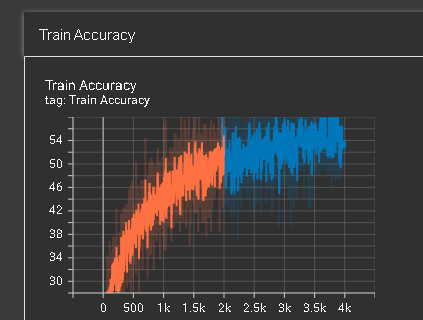

### ConvNet Supervised Training Plot

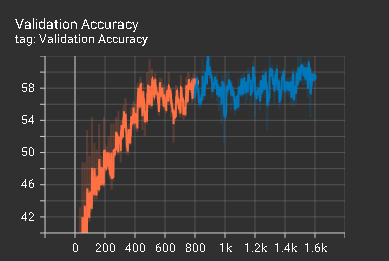

### ConvNet Supervised Validation Plot

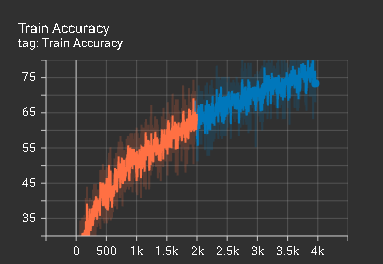

### ResNet18 Supervised Training Plot 

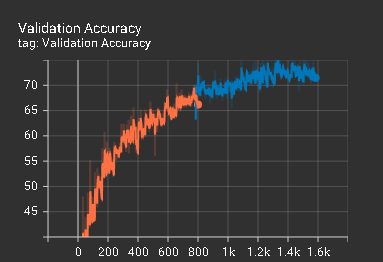

### ResNet18 Supervised Validation Plot

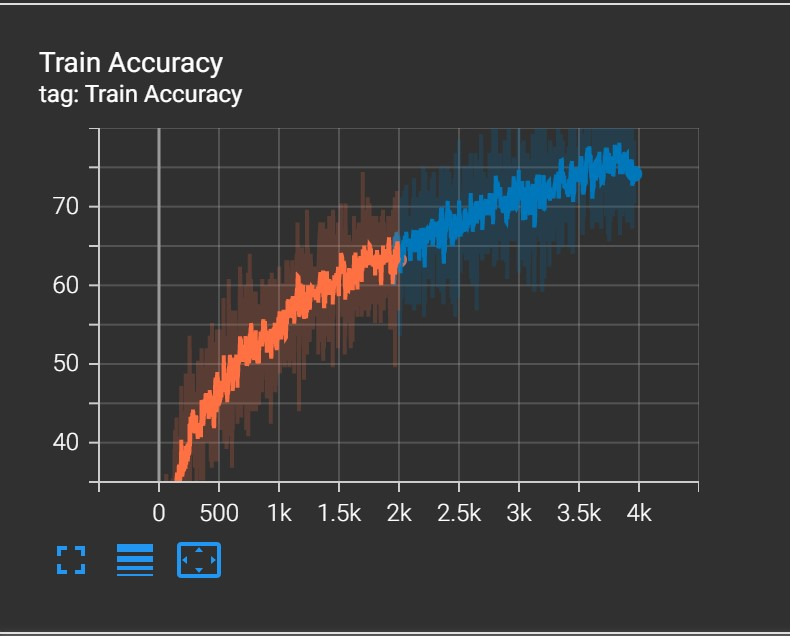

### WideResNet Supervised Training Plot

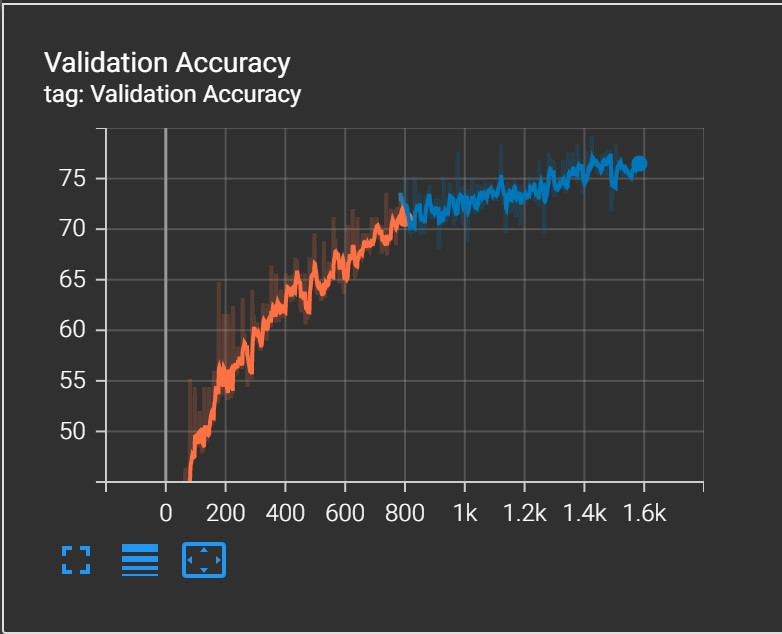

### WideResNet Supervised Validation Plot

# Self Supervised Learning

## Data Loader

In [ ]:
class Augment:
    def __init__(self):
        self.transform = transforms.Compose(
            [
                transforms.RandomResizedCrop(96, interpolation=Image.BICUBIC),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomApply(
                    [
                        transforms.ColorJitter(
                            brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1
                        )
                    ],
                    p=0.8,
                ),
                transforms.RandomGrayscale(p=0.2),
                GaussianBlur(p=1.0),
                Solarization(p=0.0),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        self.transform_weak = transforms.Compose(
            [
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomResizedCrop(96, interpolation=Image.BICUBIC),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )
        self.transform_prime = transforms.Compose(
            [
                transforms.RandomResizedCrop(96, interpolation=Image.BICUBIC),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomApply(
                    [
                        transforms.ColorJitter(
                            brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1
                        )
                    ],
                    p=0.8,
                ),
                transforms.RandomGrayscale(p=0.2),
                GaussianBlur(p=0.1),
                Solarization(p=0.2),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

    def __call__(self, x):
        y1 = self.transform(x)
        # y1 = x
        y2 = self.transform_prime(x)
        return y1, y2

In [ ]:
u_batch_size = 100
ul_ds = STL10(
    root="/content/drive/MyDrive/data", split="unlabeled", transform=Augment()
)
ul_loader = DataLoader(ul_ds, batch_size=u_batch_size, shuffle=False)


## Architecture

## Task 2.
Use the Barlow Twins method to train a neural network on a subset of the unla-
belled part of STL-10 to produce appropriate embeddings. For this you should read

through [2]. While you don’t need to understand the complete paper, it will give
you helpful context and it also has PyTorch style pseudocode which may help you
write your own implementation. The size of the subset along with the particular
architecture of the neural network is upto you.

### BarloTwins Losser

In [ ]:
class BarloTwins(nn.Module):
    def __init__(self, in_features, lambd=0.0051):
        super().__init__()
        self.lambd = lambd
        self.bn = nn.BatchNorm1d(in_features, affine=False).to(device)

    def off_diagonal(self, x):
        # return a flattened view of the off-diagonal elements of a square matrix
        n, m = x.shape
        assert n == m
        return x.flatten()[:-1].view(n - 1, n + 1)[:, 1:].flatten()

    def forward(self, z1, z2):
        """
        Input: z1, z2 embeddings
        Returns loss by barlo twins method
        """
        # compute embeddings
        # z1 = self.backbone(y1)
        # z2 = self.backbone(y2)

        # empirical cross-correlation matrix
        c = self.bn(z1).T @ self.bn(z2)

        # sum the cross-correlation matrix between all gpus
        c.div_(z1.size()[0])
        # torch.distributed.all_reduce(c)
        on_diag = torch.diagonal(c).add_(-1).pow_(2).sum()
        off_diag = self.off_diagonal(c).pow_(2).sum()
        loss = on_diag + self.lambd * off_diag
        return loss

## Task 3. 
Visualise how your representation space evolves during training in the self-supervised
approach from Step 2. You are free to do this in any way you feel appropriate. The
goal should be to convey the changes to the representation space in an intuitive
way. (Hint: t-SNE).

## Embedding Visualisation

In [ ]:
class Embedding:
    def __init__(self, unsup_model, n_components=2, device=device):
        self.projector = unsup_model.to(device).eval()
        self.n_components = n_components
        self.tsne = TSNE(random_state=42, metric="cosine", n_components=2)

    def GetEmbedding(self, dataset, batch_size=100, max=1000):
        data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
        embeddings, classes = [], []
        cx = 0
        with torch.no_grad():
            for batch, c in data_loader:
                cx += 1
                batch = batch.to(device)
                embeddings.append(self.projector(batch).detach())
                classes.append(c)
                if cx % math.ceil(max // batch_size) == 0:
                    break
        # print(embeddings, classes)
        return torch.cat(embeddings).cpu().numpy(), torch.cat(classes).numpy()

    def TSNEReduceDim(self, embeddings):
        embeddings = self.tsne.fit_transform(embeddings)
        x, y = embeddings[:, 0], embeddings[:, 1]
        return x, y

    def TSNEVis(
        self,
        embedding,
        classes,
        epoch,
        savepath="/content/drive/MyDrive/embeddingfigs_ResNet18/",
    ):
        os.system(f"mkdir -p {savepath}")
        x, y = self.TSNEReduceDim(embedding)
        plot = pd.DataFrame({"x": x, "y": y, "class": classes})
        plot["class"] = plot["class"].replace(
            {i: c for i, c in enumerate(train_ds.classes)}
        )
        fig = sns.scatterplot(x="x", y="y", hue="class", data=plot).figure
        fig.savefig(f"{savepath}{epoch}.png")
        plt.close(fig)

## Task 4.
Learn a linear classifier on top of the embedding network learnt in Step 2(whose
weights should be frozen) using the training portion of the labeled part of STL-10 .

## Training Loop

In [ ]:
def self_supervised_train_loop(unsup_model, lr = 1e-3, epochs = 50, checkpoint = ""):

    emb_model = Embedding(unsup_model=unsup_model)
    optimizer = optim.Adam(unsup_model.parameters(), lr=lr)
    losser = BarloTwins(unsup_model.out_features)
    # tb_graph(unsup_model, "UnsupervisedWideResNet")
    train_accuracy, val_accuracy = 0, 0
    model_class = type(unsup_model).__name__ 

    if checkpoint != "":
        checkpoint = torch.load(checkpoint)
        unsup_model.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        epoch = checkpoint['epoch']
    else:
        epoch=0


    tb = SummaryWriter(
        f"/content/drive/MyDrive/logs/runs/self_supervised/{model_class}/"
        + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        + f"{epochs}epochs"
    )

    with tqdm(range(epochs), desc="Train Loop", total=epochs,) as outer:

        for epoch in outer:
            running_train_loss = 0

            with tqdm(
                enumerate(ul_loader),
                desc="Train Batch Loop",
                total=len(ul_loader),
                leave=False,
            ) as inner:
                for idx, ((y_a, y_b), _) in inner:
                    optimizer.zero_grad()
                    y_a, y_b = y_a.to(device), y_b.to(device)

                    # compute embedding and return loss
                    z_a = unsup_model(y_a)
                    z_b = unsup_model(y_b)

                    loss = losser(z_a, z_b)
                    loss.backward()
                    optimizer.step()
                    running_train_loss += loss.item()

                    inner.set_postfix(
                        loss=running_train_loss / (idx + 1),
                        train_clf_accuracy=train_accuracy,
                        val_clf_accuracy=val_accuracy,
                    )

                    tb.add_scalar("Train Loss", loss, epoch * len(ul_loader) + idx + 1)

                    if (epoch * len(ul_loader) + idx + 1) % 20 == 0:
                        X_train, y_train = emb_model.GetEmbedding(train_ds, max=1e5)
                        X_val, y_val = emb_model.GetEmbedding(val_ds, max=1e5)
                        model = LogisticRegression()
                        model.fit(X_train, y_train)
                        val_accuracy = (model.predict(X_val) == (y_val)).mean() * 100
                        train_accuracy = (model.predict(X_train) == (y_train)).mean() * 100

                        inner.set_postfix(
                            loss=running_train_loss / (idx + 1),
                            train_clf_accuracy=train_accuracy,
                            val_clf_accuracy=val_accuracy,
                        )

                        tb.add_scalar(
                            "Train CLF Accuracy",
                            train_accuracy,
                            epoch * len(ul_loader) + idx + 1,
                        )
                        tb.add_scalar(
                            "Val CLF Accuracy",
                            val_accuracy,
                            epoch * len(ul_loader) + idx + 1,
                        )

                    if (epoch * len(ul_loader) + idx + 1) % 50 == 0:
                        embeddings, classes = emb_model.GetEmbedding(test_ds)
                        emb_model.TSNEVis(
                            embeddings, classes, epoch * len(ul_loader) + idx + 1
                        )

            checkpoint = {
                "epoch": epoch,
                "model": unsup_model.state_dict(),
                "optimizer": optimizer.state_dict(),
            }

            save_path = f"/content/drive/MyDrive/self_supervised_weights_{model_class}/"
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            save_path += (
                "weight_"
                + model_class
                + "_"
                + str(datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
                + str(epochs)
                + f"epochs.pth"
            )
            torch.save(checkpoint, save_path)


    return unsup_model

In [ ]:
unsup_model = ResNet18().to(device)
lr = 5e-4
epochs = 4
returned_model = self_supervised_train_loop(unsup_model, lr = lr, epochs = epochs, checkpoint = "")
print(returned_model)

Train Loop:   0%|          | 0/2 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/1000 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/1000 [00:00<?, ?it/s]

ResNet18(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

## Self Supervised Training Plots and Results

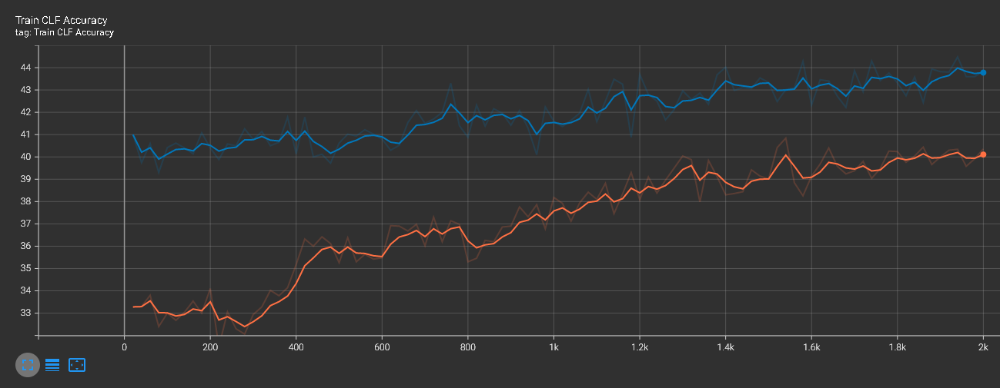

### ConvNet Self-Supervised Training Plot

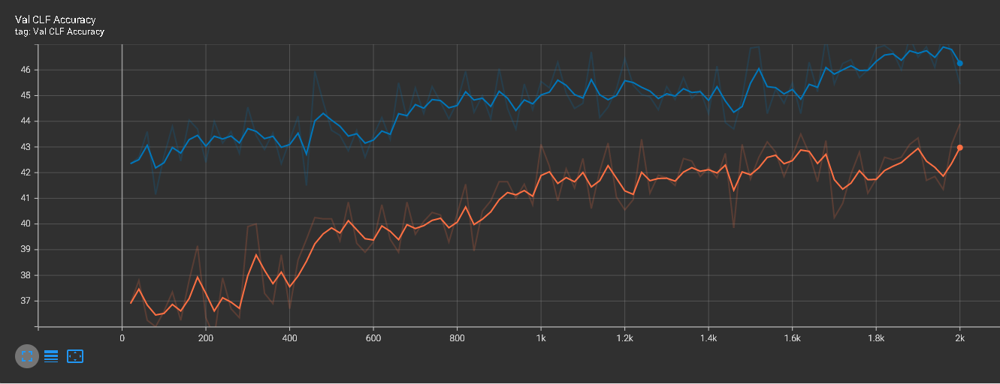

### ConvNet Self-Supervised Validation Plot

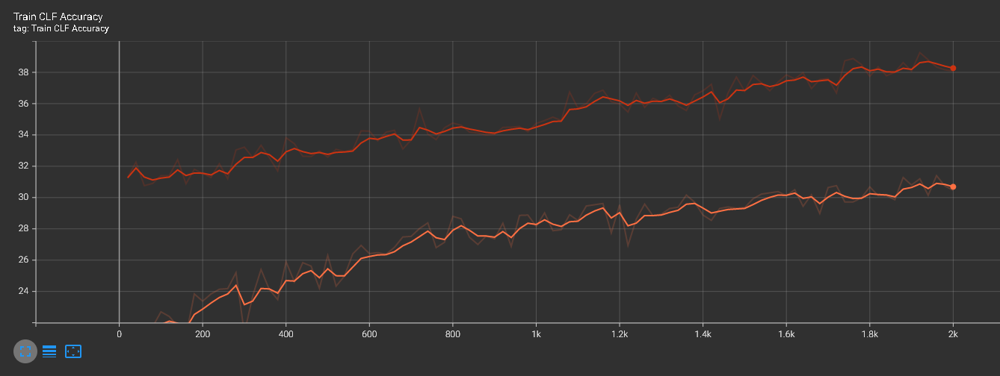

### ResNet18 Self-Supervised Training Plot

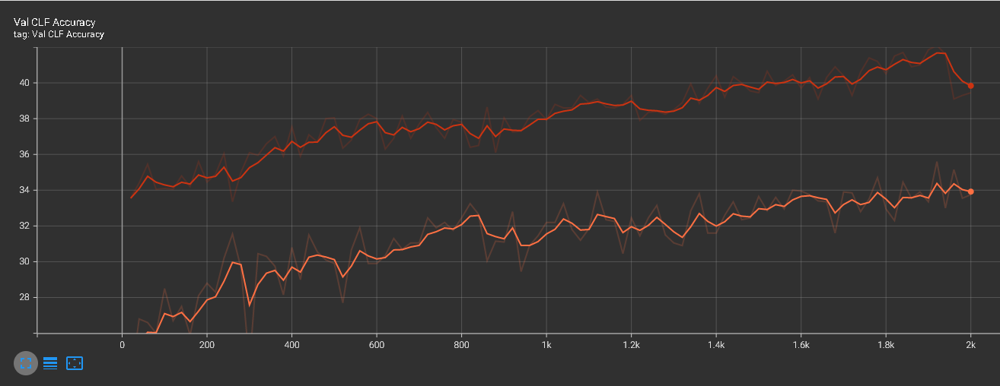

### ResNet18 Self-Supervised Validation Plot

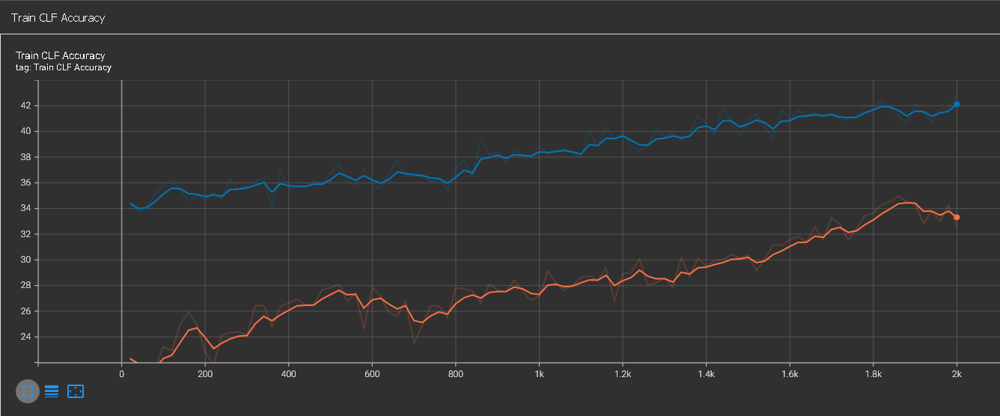

### WideResNet Self-Supervised Training Plot

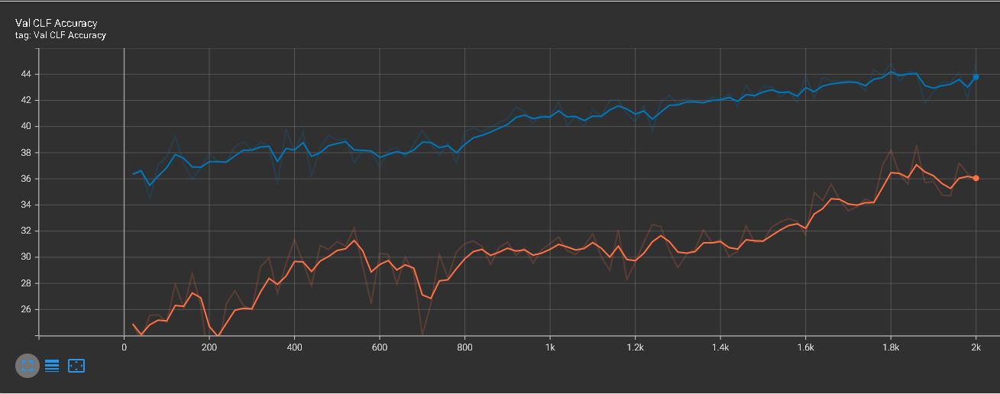

### WideResNet Self-Supervised Validation Plot 

<hr>

# Semi Supervised Learning

In [ ]:
sup_batch_size = 32
self_batch_size = sup_batch_size * 2
l_size = 5000
ul_max_steps = int(l_size / self_batch_size)

ul_loader = DataLoader(ul_ds, batch_size=self_batch_size, shuffle=False)
train_loader = DataLoader(train_ds, batch_size=sup_batch_size, shuffle=False)
val_loader = DataLoader(val_ds, batch_size=sup_batch_size, shuffle=False)

In [ ]:
ul_max_steps

78

In [ ]:
class SSL(nn.Module):
    def __init__(self, model):
        super(SSL, self).__init__()
        
        # BackBone Feature Extractor
        self.model = model

    def forward(self, x_l, x_s=None, x_w=None):
        x_l = self.model(x_l)

        if type(x_s) != type(None):
            logits_x_s, logits_x_w = self.model(x_s), self.model(x_w)
            
            pseudo_label = torch.softmax(logits_x_s.detach(), dim=-1)
            max_probs, targets_u = torch.max(pseudo_label, dim=-1)    
            # mask = max_probs.ge(0.0).float()
            
            #Lu = (F.cross_entropy(logits_x_w, targets_u, reduction='none') * mask).mean()
            Lu = (F.cross_entropy(logits_x_w, targets_u, reduction='none')).mean()
            # print(Lu)
            return x_l, Lu

## Pipeline

In [ ]:
lr=2e-3
losser = nn.CrossEntropyLoss()
# change ssl_model
ssl_model = SSL(LinearClassifier(ResNet18(), 10)).to(device)
optimizer = optim.Adam(ssl_model.parameters(), lr=lr)
lam = 1

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/supervsied_weights_ResNet18/weightResNet18_20211209-16150750epochs.pth")

model = LinearClassifier(ResNet18(), 10)
model.load_state_dict(checkpoint['model'])
ssl_model.model = model
ssl_model.to('cuda')

SSL(
  (model): LinearClassifier(
    (feature_extractor): ResNet18(
      (model): ResNet(
        (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (layer1): Sequential(
          (0): BasicBlock(
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (relu): ReLU(inplace=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
          (1): BasicBlock(
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), str

## Task 5.
Having trained a fully supervised and a fully self-supervised model, consider a
case where your training data consists of some mix of unlabeled and labeled data
from STL-10. Formulate a way to combine both the supervised and self-supervised
training procedures to make use of such a dataset to train a classifier.

In [ ]:
## For First Epoch
train_iterator = iter(train_loader)
with tqdm(enumerate(ul_loader), total=ul_max_steps) as loop:
    for counter, ((y_a, y_b), _) in loop:
        if counter % ul_max_steps == 0:
          dr = 0.0
          checkpoint = {
                          "model": ssl_model.model.state_dict(),
                          "optimizer": optimizer.state_dict(),
                      }
          save_path = f"/content/drive/MyDrive/half_semi_{model.name}/"
          if not os.path.exists(save_path):
            os.makedirs(save_path)
          save_path += f"half_semi_{model.name}_{counter // ul_max_steps}_dr_{dr}.pth"
          torch.save(checkpoint, save_path)
        optimizer.zero_grad()
        try:
            l_image, labels = next(train_iterator)
        except:
            train_iterator = iter(train_loader)
            l_image, labels = next(train_iterator)
        
        l_image, labels = l_image.to(device), labels.to(device)
        y_a, y_b = y_a.to(device), y_b.to(device) 
        prob, ul_loss = ssl_model(l_image, y_a, y_b)
        sup_loss = losser(prob, labels)
        loss = (sup_loss + lam*ul_loss)
        loss.backward()
        optimizer.step()
        loop.set_postfix(accuracy = (prob.argmax(dim=1) == labels).sum().item() / labels.size()[0], loss = loss.item(), supervised = sup_loss.item(), ul_loss = ul_loss.item())

  0%|          | 0/78 [00:00<?, ?it/s]

In [ ]:
dr = 0.0

Now train load the unlabel + train_label trained semi_sup_model in supervised manner to get validation accuracy

In [ ]:
def semi_train_loop(sup_model = WideResNet().to(device) , lr = 2e-3, epochs = 50, ratio=1, checkpoint=""):
    # sup_model = LinearClassifier(extractor, len(classes)).to(device)
    optimizer = optim.Adam(sup_model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    epoch = 0
    if checkpoint != "":
        checkpoint = torch.load(checkpoint)
        sup_model.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
    else:
        epoch=0
            
    model_class = sup_model.name
    tb_graph(sup_model, model_class)
    tb = SummaryWriter(
        f"/content/drive/MyDrive/logs/runs/semi_supervised/{model_class}_ratio_{ratio}_dr_{dr}/"
        + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        + f"{epochs}epochs"
    )

    with tqdm(range(epoch, epoch+epochs), desc="Train Loop", total=epochs,) as outer:

        for epoch in outer:
            running_train_loss, running_train_accuracy = 0, 0
            running_val_accuracy = 0

            with tqdm(
                enumerate(train_loader),
                desc="Train Batch Loop",
                total=len(train_loader),
                leave=False,
            ) as inner:

                for idx, (images, labels) in inner:
                    loss, accuracy = train_batch(images, labels, sup_model, optimizer, criterion)
                    running_train_loss += loss
                    running_train_accuracy += accuracy

                    inner.set_postfix(
                        accuracy=100 * running_train_accuracy / (idx + 1),
                        loss=running_train_loss / (idx + 1),
                    )

                    tb.add_scalar("Train Loss", loss, epoch * len(train_loader) + idx + 1)
                    tb.add_scalar(
                        "Train Accuracy",
                        100 * accuracy,
                        epoch * len(train_loader) + idx + 1,
                    )

            with tqdm(
                enumerate(val_loader),
                desc="Eval Batch Loop",
                total=len(val_loader),
                leave=False,
            ) as inner:
                with torch.no_grad():
                    for idx, (images, labels) in inner:
                        running_val_accuracy += eval_batch(images, labels, sup_model)
                        inner.set_postfix(accuracy=100 * running_val_accuracy / (idx + 1),)
                        tb.add_scalar(
                            "Validation Accuracy",
                            100 * running_val_accuracy / (idx + 1),
                            epoch * len(val_loader) + idx + 1,
                        )

            outer.set_postfix(
                train_loss=running_train_loss / (len(train_loader)),
                train_accuracy=100 * running_train_accuracy / (len(train_loader)),
                val_accuracy=100 * running_val_accuracy / (len(val_loader)),
            )

            checkpoint = {
                "epoch": epoch,
                "model": sup_model.state_dict(),
                "optimizer": optimizer.state_dict(),
            }

            save_path = f"/content/drive/MyDrive/semi_supervised_weights_{model_class}/ratio_{ratio}_dr_{dr}/"
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            save_path += (
                "weight"
                + model_class
                +"_"
                + str(datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
                + str(epochs)
                + f"epochs.pth"
            )
            torch.save(checkpoint, save_path)

    return sup_model

In [ ]:
semi_train_loop(sup_model = LinearClassifier(ResNet18(), 10) , lr = 2e-3, epochs = 50 , ratio = 10, checkpoint= "/content/drive/MyDrive/half_semi_ResNet18/half_semi_ResNet18_10_dr_0.0.pth")

Train Loop:   0%|          | 0/50 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

Train Batch Loop:   0%|          | 0/157 [00:00<?, ?it/s]

Eval Batch Loop:   0%|          | 0/63 [00:00<?, ?it/s]

LinearClassifier(
  (feature_extractor): ResNet18(
    (model): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        

## Semi-Supervised Training Plots and Results

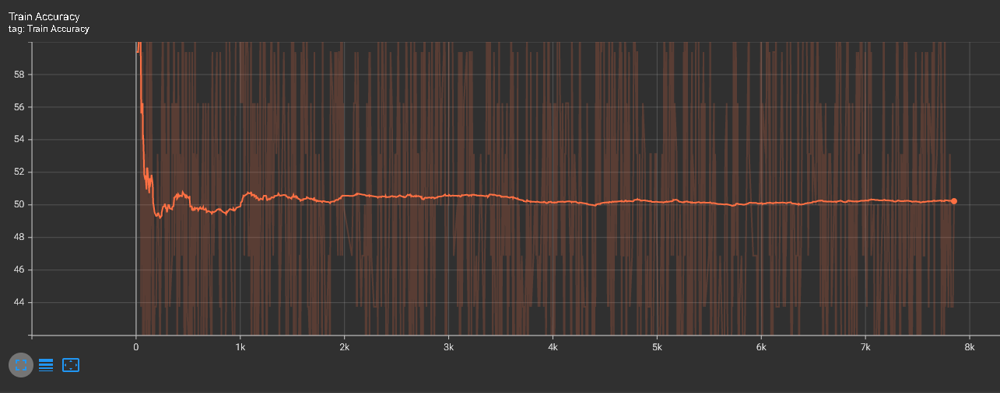

### ConvNet Semi-Supervised training Plot

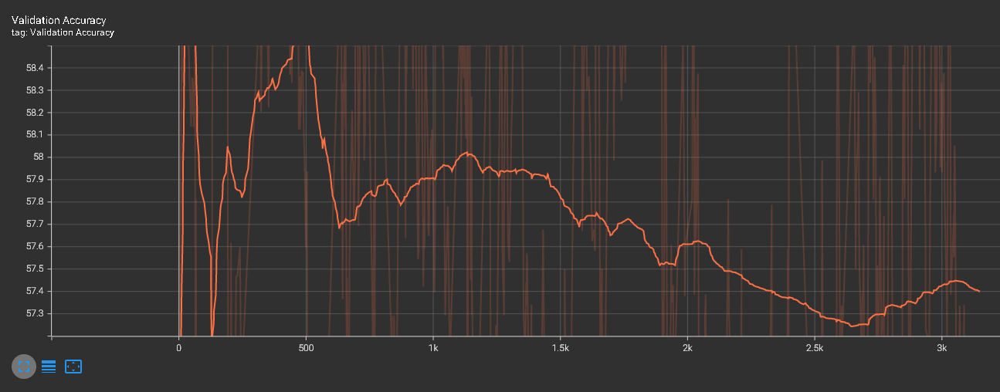

### ConvNet Semi-Supervised Validation Plot

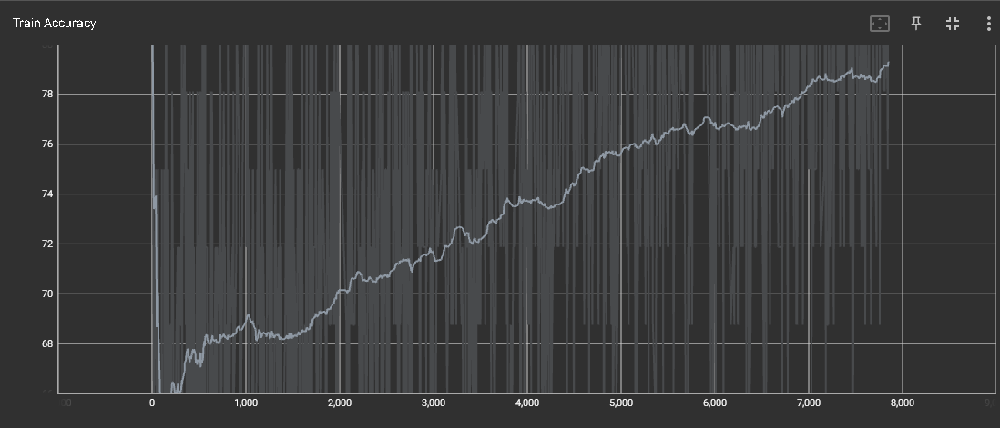

### ResNet18 Semi-Supervised Training Plot

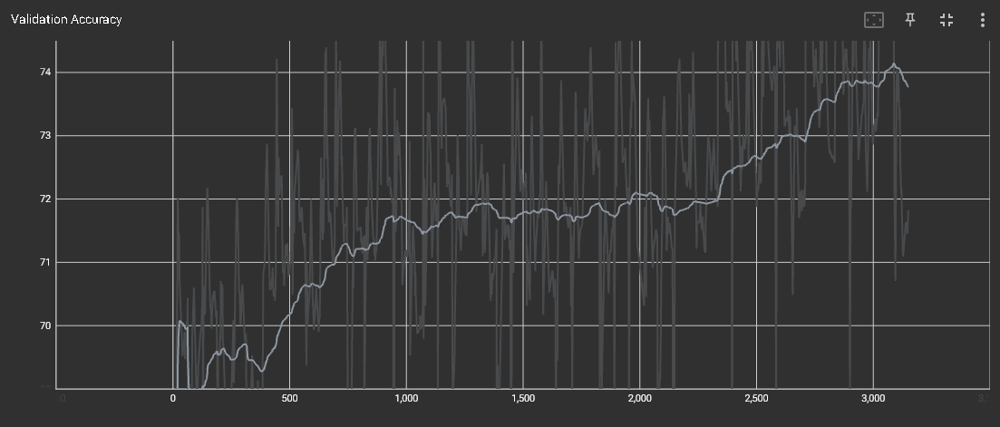

### ResNet18 Semi-Supervised Validation Plot

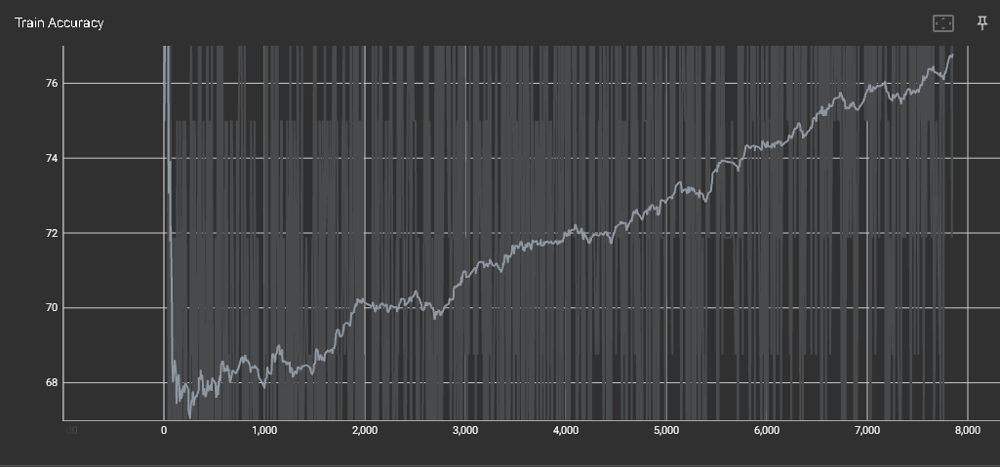

### WideResNet Semi-Supervised Training Plot

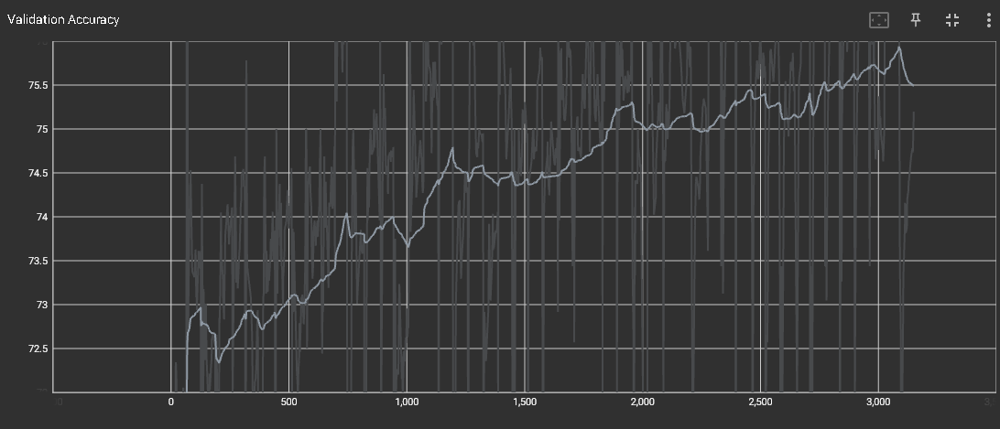

### WideResNet Semi-Supervised Validation Plot

# Model Evaluation on Test Dataset

## Task 6.
Compare the performance of of the classifiers from Steps 1, 4 and 5.

## Supervised

In [ ]:
def supervised_test_loop(extractor = WideResNet().to(device) , lr = 2e-3, epochs = 50, checkpoint=""):
    sup_model = LinearClassifier(extractor, len(classes)).to(device)
    optimizer = optim.Adam(sup_model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    epoch = 0

    if checkpoint != "":
      checkpoint = torch.load(checkpoint)
      sup_model.load_state_dict(checkpoint['model'])
      optimizer.load_state_dict(checkpoint['optimizer'])
    else:
      print("Load supervised checkpoint to proceed!")
      sys.exit()
            
    model_class = sup_model.name
    tb = SummaryWriter(
        f"/content/drive/MyDrive/logs/runs/test/supervised/{model_class}/"
        + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        + f"{epochs}epochs"
    )

    with tqdm(range(epoch, epoch+epochs), desc="Test Loop", total=epochs,) as outer:
        for epoch in outer:
            running_test_accuracy = 0

            with tqdm(
                enumerate(test_loader),
                desc="Test Batch Loop",
                total=len(test_loader),
                leave=False,
            ) as inner:
                with torch.no_grad():
                    for idx, (images, labels) in inner:
                        running_test_accuracy += eval_batch(images, labels, sup_model)
                        inner.set_postfix(accuracy=100 * running_test_accuracy / (idx + 1),)
                        tb.add_scalar(
                            "Test Accuracy",
                            100 * running_test_accuracy / (idx + 1),
                            epoch * len(test_loader) + idx + 1,
                        )

            outer.set_postfix(
                test_accuracy=100 * running_test_accuracy / (len(test_loader)),
            )

    return sup_model

In [ ]:
supervised_test_loop(extractor = WideResNet().to(device) , lr = 2e-3, epochs = 50, checkpoint="")

Test Loop:   0%|          | 0/50 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

LinearClassifier(
  (feature_extractor): WideResNet(
    (conv1): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (block1): NetworkBlock(
      (layer): Sequential(
        (0): BasicBlock(
          (bn1): BatchNorm2d(8, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
          (relu1): LeakyReLU(negative_slope=0.1, inplace=True)
          (conv1): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(16, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
          (relu2): LeakyReLU(negative_slope=0.1, inplace=True)
          (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (convShortcut): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        )
        (1): BasicBlock(
          (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
          (relu1): LeakyReLU(negative_slo

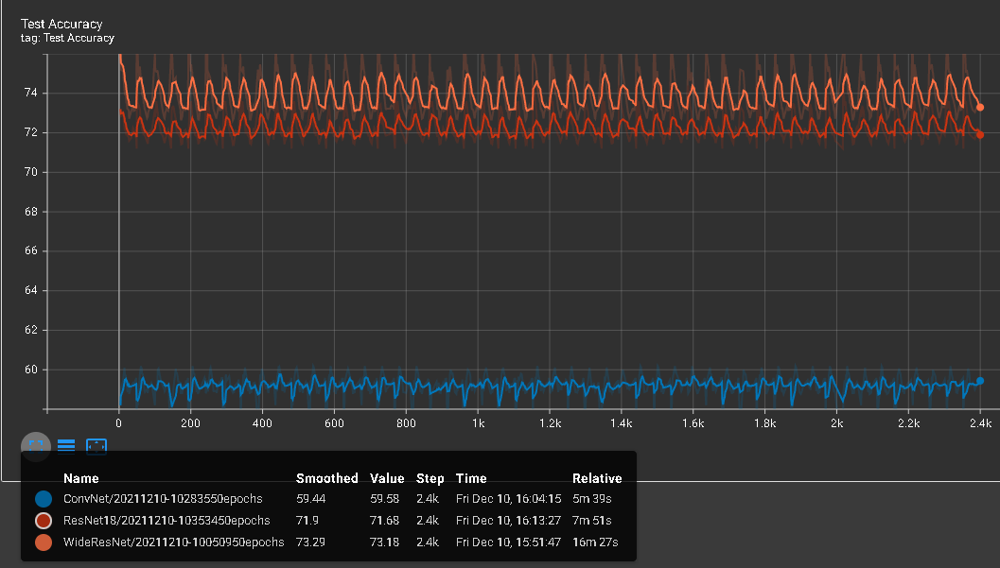

### Supervised Test Plots

## Semi-supervised

In [ ]:
def semi_supervised_test_loop(extractor = WideResNet().to(device) , lr = 2e-3, epochs = 50, checkpoint=""):
    sup_model = LinearClassifier(extractor, len(classes)).to(device)
    optimizer = optim.Adam(sup_model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    epoch = 0

    if checkpoint != "":
      checkpoint = torch.load(checkpoint)
      sup_model.load_state_dict(checkpoint['model'])
      optimizer.load_state_dict(checkpoint['optimizer'])
    else:
      print("Load supervised checkpoint to proceed!")
      sys.exit()
            
    model_class = sup_model.name
    tb = SummaryWriter(
        f"/content/drive/MyDrive/logs/runs/test/semi_supervised/{model_class}/"
        + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        + f"{epochs}epochs"
    )

    with tqdm(range(epoch, epoch+epochs), desc="Test Loop", total=epochs,) as outer:
        for epoch in outer:
            running_test_accuracy = 0

            with tqdm(
                enumerate(test_loader),
                desc="Test Batch Loop",
                total=len(test_loader),
                leave=False,
            ) as inner:
                with torch.no_grad():
                    for idx, (images, labels) in inner:
                        running_test_accuracy += eval_batch(images, labels, sup_model)
                        inner.set_postfix(accuracy=100 * running_test_accuracy / (idx + 1),)
                        tb.add_scalar(
                            "Test Accuracy",
                            100 * running_test_accuracy / (idx + 1),
                            epoch * len(test_loader) + idx + 1,
                        )

            outer.set_postfix(
                test_accuracy=100 * running_test_accuracy / (len(test_loader)),
            )

    return sup_model

In [ ]:
semi_supervised_test_loop(extractor = ConvNet().to(device) , lr = 2e-3, epochs = 50, checkpoint="/content/drive/MyDrive/semi_supervised_weights_ConvNet/ratio_20_dr_0.0/weightConvNet_20211210-06175450epochs.pth")

Test Loop:   0%|          | 0/50 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

Test Batch Loop:   0%|          | 0/48 [00:00<?, ?it/s]

LinearClassifier(
  (feature_extractor): ConvNet(
    (conv): Sequential(
      (0): BasicConv(
        (conv): Conv2d(3, 128, kernel_size=(3, 3), stride=(2, 2))
        (relu): ReLU()
        (dropout): Dropout2d(p=0.0, inplace=False)
      )
      (1): BasicConv(
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
        (relu): ReLU()
        (dropout): Dropout2d(p=0.0, inplace=False)
      )
      (2): BasicConv(
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
        (relu): ReLU()
        (dropout): Dropout2d(p=0.0, inplace=False)
      )
      (3): BasicConv(
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
        (relu): ReLU()
        (dropout): Dropout2d(p=0.0, inplace=False)
      )
      (4): BasicConv(
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
        (relu): ReLU()
        (dropout): Dropout2d(p=0.0, inplace=False)
      )
      (5): Flatten(start_dim=1, end_dim=-1)
    )
  )
  (fc): Linear

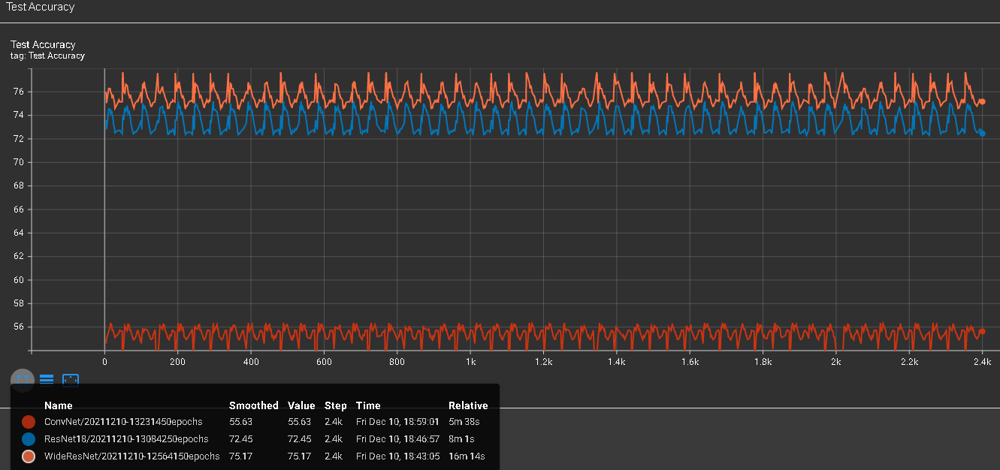

### Semi-Supervised Test plots

# RESULTS AND DISCUSSIONS


## Embeddings Comparison

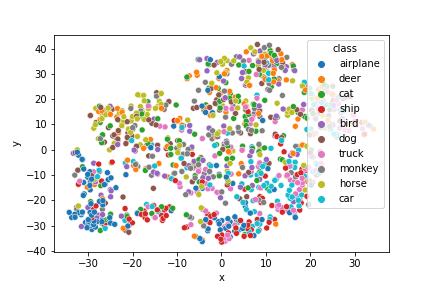

### Before Training ConvNet

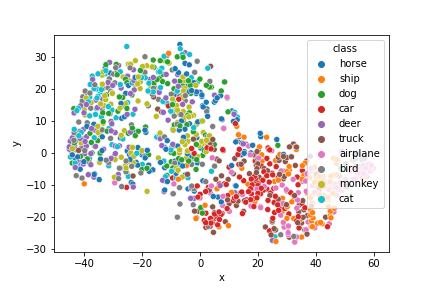

### After ConvNet was trained

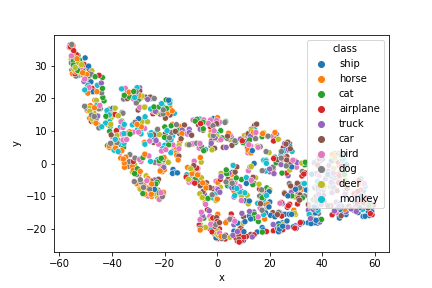

### Before Training WideResNet

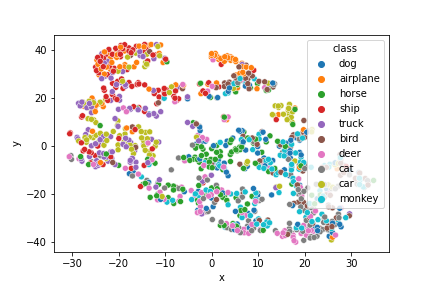

### After WideResNet was trained

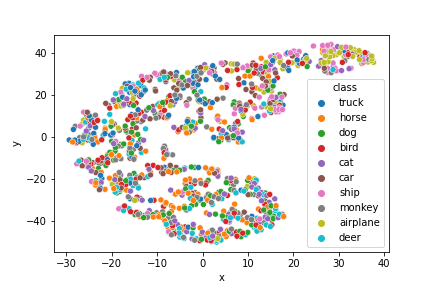

### Before Training ResNet18

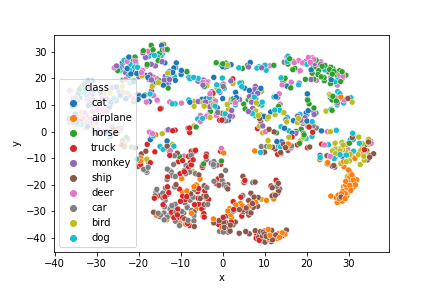

### After ResNet18 was trained 

### Observations

A detailed inspection of the t-SNE map reveals that much of the local structure of the data (such as the orientation of the ones) is captured as well. We make following observations:

* Among all three models, WRN-45-2 classifies the unlabelled
dataset into most accurate categories. ConvNet classifies data into two dominant categories(vehicles and animals).

* ResNet18 provides a better classification of categories.

* However, the distinction between categories is still lower than WRN-45-2. 

* After 4 epochs of self-supervised training, all 3 models learn higher-level feature representations from unlabelled data and seperation between the clusters become more prominent. This is evident from t-SNE visualization
of WRN-45-2 during self-supervised learning

# Ablation studies on various ratios of lablled and unlabelled data

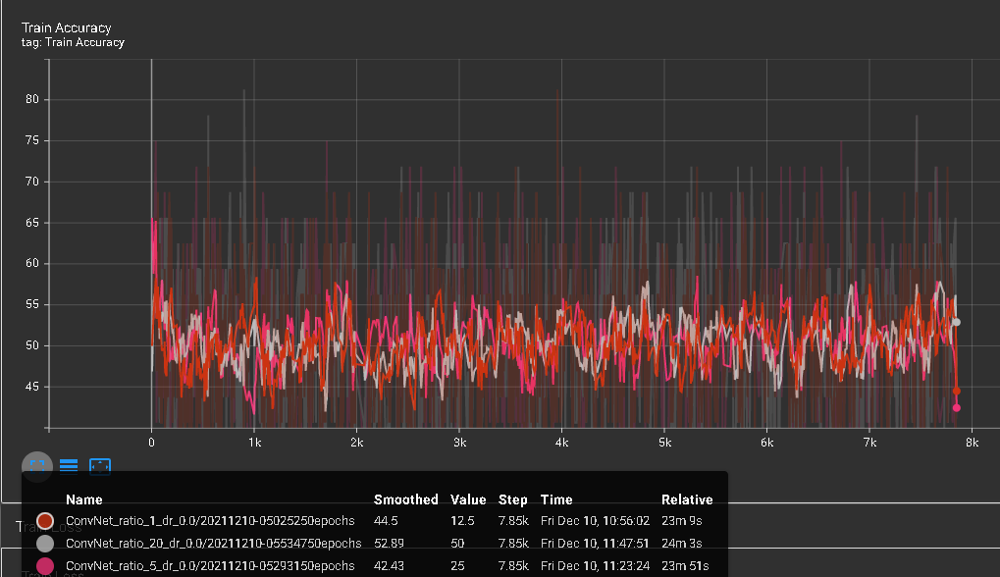
Convnet ratio 1:1, 1:5, 1:20 training plots

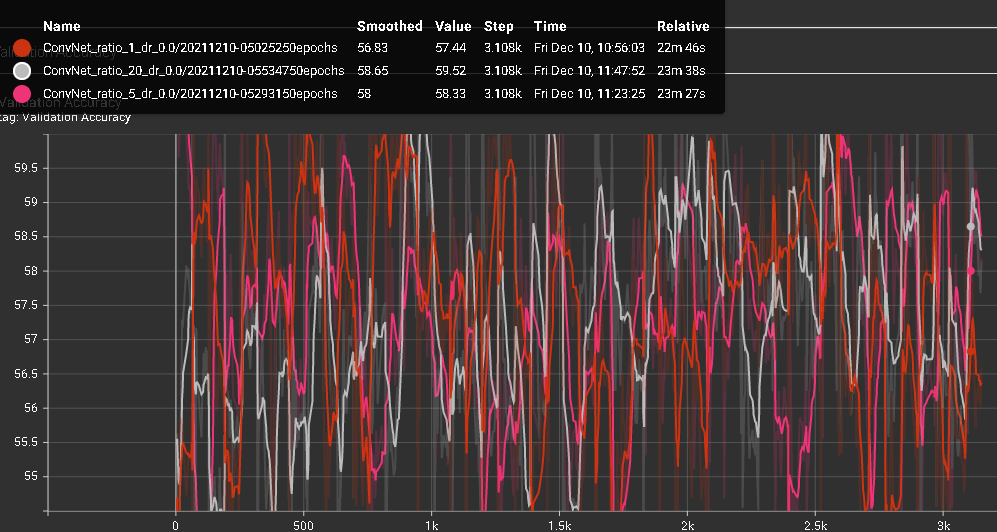
ConvNet ratio 1:1, 1:5, 1:20

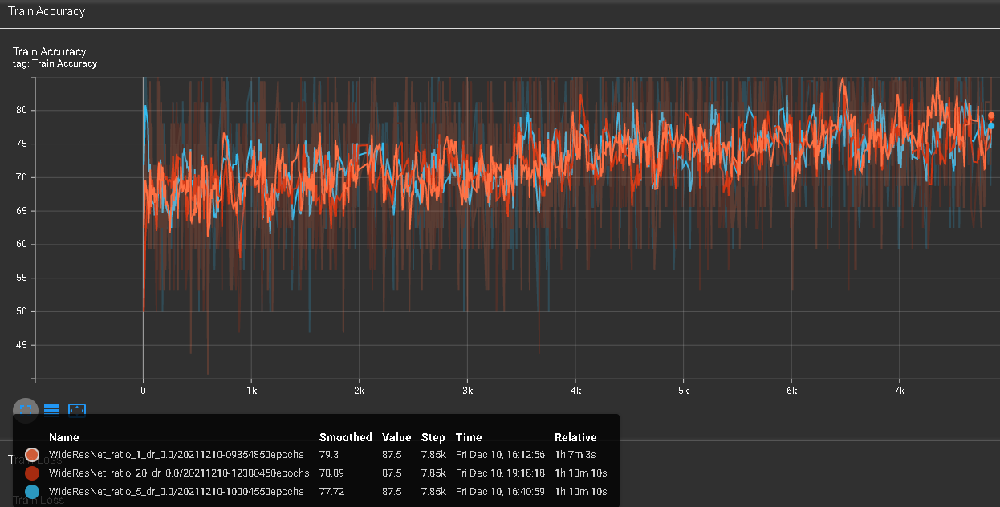

WRN-45-2 ratio 1, 5, 20 training

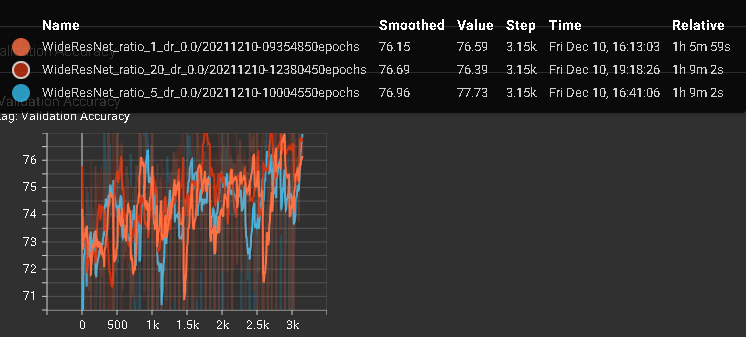

WRN-45-2 ratio 1, 5, 10 validation plots

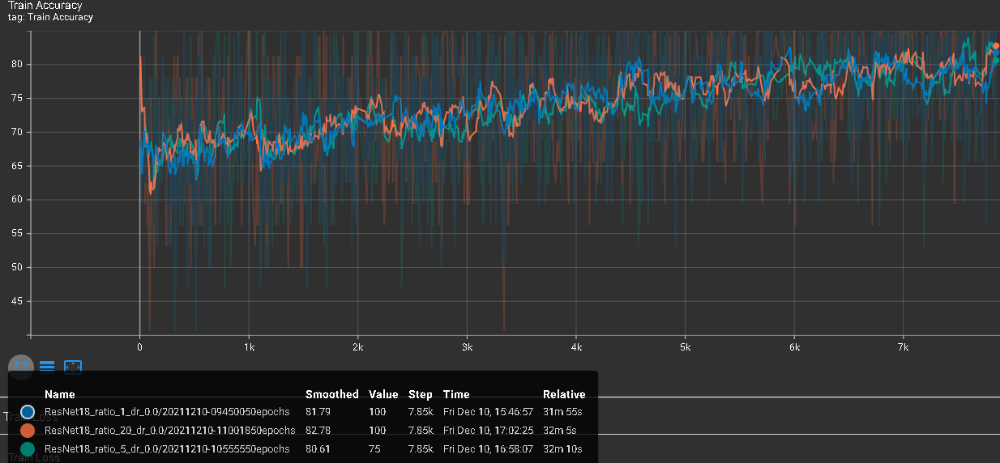

ResNet18 1, 5, 20 training plot

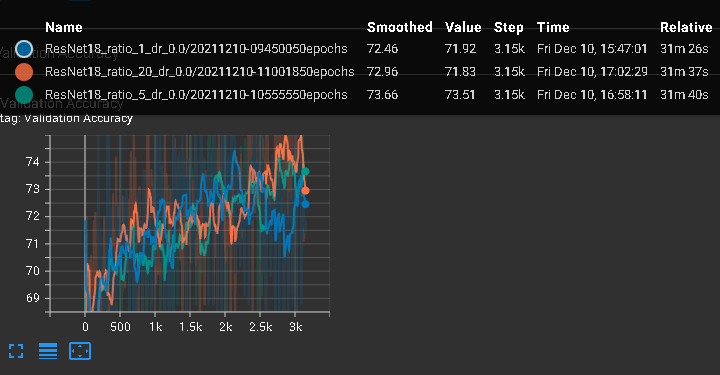

ResNet18 ratio 1, 5, 20 validation plot

We compare the performance of all three model architectures  using semi-supervised  learning  approach  by varying  ratio  of  labelled  and  unlabelled  data  given  as  input. Ratios taken are 1:1, 1:5 and 1:20. It can be observed that as amount of unlabelled data is increased, both training accuracy  and  validation  accuracy  increase  in  general.  The change is significant in ConvNet and marginal in ResNet18 and WideResNet.

# Results and Discussions

WRN-45-2 performs better than ResNet and ConvNet due to the fact that in ResNet, the gradient flows through skip-connections instead of residual connections. This leads to loss of feature representation learning in the network and less information retention. This problem was formulated as diminishing feature reuse. Due to its widened Network Blocks, WRN-45-2 does not reuse diminished features.

It can be inferred that in our setup, semi-supervised learning approach produces much better training and validation accuracies as compared to supervised and self-supervised learning approaches due its combined loss function.


# Contributions

Somesh K. Singh [2018A7PS0175G] - 
Self-Supervised Learning : Barlow Twins loss function, t-SNE visualisations, Training Procedure, Weight and Loop Checkpoint, Data Augmentation, Plots, Tables, Figures.

Rohit Garg [2018A7PS0193G] - 
Semi-Supervised : Training Procedure, Weight and Loop Checkpoint, Data Augmentation, Pseudo labelling, Losser Class, Plots, Tables, Figures.



Aditya Mishra [2018A70117G] - Supervised: Training Procedure, Weight and Loop Checkpoint, Data Transformation, Plots, Tables, Figures.   

All three together implemented architctures, studied Embedded Comparisons, Performed Ablation Studies.

# Link to weights and logs:

https://drive.google.com/drive/folders/1Nz1IJ4xqe1voMADNgmfSTvP6U25cymd_?usp=sharing